<a href="https://colab.research.google.com/github/Omarelfarouk90/Cleaning-and-analysis-projects/blob/main/Big_data_analytics_on_smart_grid_system_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/My Drive/Colab Notebooks/

/content/drive/My Drive/Colab Notebooks


# Current directory

installing the PY spark on the google colab


In [ ]:
!pip install pyspark
!pip install -U -q PyDrive
!apt install openjdk-8-jdk-headless -qq
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"

     |████████████████████████████████| 212.4 MB 61 kB/s 
     |████████████████████████████████| 198 kB 18.8 MB/s 
  Created wheel for pyspark: filename=pyspark-3.1.2-py2.py3-none-any.whl size=212880768 sha256=a0cdcf75ca3c195c6fd7b7f84f113219685abaa889e988160c2dd1cb98fb9f8c
  Stored in directory: /root/.cache/pip/wheels/a5/0a/c1/9561f6fecb759579a7d863dcd846daaa95f598744e71b02c77
Successfully built pyspark
The following additional packages will be installed:
  openjdk-8-jre-headless
Suggested packages:
  openjdk-8-demo openjdk-8-source libnss-mdns fonts-dejavu-extra
  fonts-ipafont-gothic fonts-ipafont-mincho fonts-wqy-microhei
  fonts-wqy-zenhei fonts-indic
The following NEW packages will be installed:
  openjdk-8-jdk-headless openjdk-8-jre-headless
0 upgraded, 2 newly installed, 0 to remove and 37 not upgraded.
Need to get 36.5 MB of archives.
After this operation, 143 MB of additional disk space will be used.
Selecting previously unselected package openjdk-8-jre-headless:amd64.
(Rea

importing the essential python libraries, such as pandas, numpy and matplotlib

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import pyspark
from pyspark.sql import *
from pyspark.sql.types import *
from pyspark.sql.functions import *
from pyspark import SparkContext, SparkConf



creating the datapipeline by adding a port using apache spark

In [ ]:
# create the session
conf = SparkConf().set("spark.ui.port", "4050")

# create the context
sc = pyspark.SparkContext(conf=conf)
spark = SparkSession.builder.getOrCreate()

calling the spark session to see more details about the datapipeline


In [ ]:
spark

reading the smart grid stability dataset on the `PySpark` 

In [ ]:
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.regression import LinearRegression
from pyspark.ml import Pipeline
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml.feature import StringIndexer, VectorIndexer
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

dataset = spark.read.csv('/content/drive/My Drive/smart_grid_stability_augmented.csv',inferSchema=True, header =True)



getting  information about the dataset

In [ ]:
print('Column Names', dataset.columns, '\n\n')

Column Names ['tau1', 'tau2', 'tau3', 'tau4', 'p1', 'p2', 'p3', 'p4', 'g1', 'g2', 'g3', 'g4', 'stab', 'stabf'] 




In [ ]:
dataset.count()

60000

In [ ]:
dataset.head(2)

[Row(tau1=2.95906002455997, tau2=3.07988520422811, tau3=8.38102539191882, tau4=9.78075443222607, p1=3.76308477206316, p2=-0.782603630987543, p3=-1.25739482958732, p4=-1.7230863114883, g1=0.650456460887227, g2=0.859578105752345, g3=0.887444920638513, g4=0.958033987602737, stab=0.055347489172775, stabf='unstable'),
 Row(tau1=9.3040972346785, tau2=4.90252411201167, tau3=3.04754072762177, tau4=1.36935735529605, p1=5.06781210427845, p2=-1.94005842705193, p3=-1.87274168559721, p4=-1.25501199162931, g1=0.41344056837935, g2=0.862414076352903, g3=0.562139050527675, g4=0.781759910653126, stab=-0.005957464326037, stabf='stable')]

coverting input values to vectors for the machinne learning model

In [ ]:
vectorAssembler = VectorAssembler(inputCols = ['tau1', 'tau2', 'tau3', 'tau4', 'p1', 'p2', 'p3', 'p4', 'g1', 'g2', 'g3', 'g4']\
                                  , outputCol = 'features')


In [ ]:
v_grid_df = vectorAssembler.transform(dataset)


In [ ]:
vgrid_df = v_grid_df.select(['features', 'stab'])

Using `PYSpark` for training penalized regression models on large smart grid dataset

performing the split of data for reduction and identifying the accuracy of the machine learning model


we will start the machine learning using the regression model with `stab` column 

RMS Error                      alpha
0.03609514833979524 1.0
0.030834078431480262 0.1
0.022821272818732835 0.010000000000000002
0.021910793419743727 0.0010000000000000002
0.021889876216019243 0.00010000000000000002
0.02188895488385936 1.0000000000000003e-05
0.021888875102701585 1.0000000000000004e-06


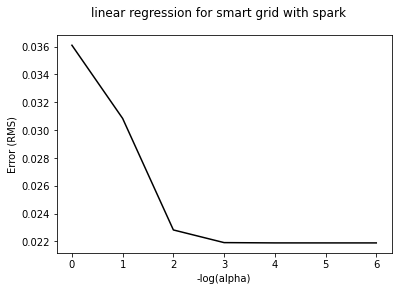

In [ ]:
splits = vgrid_df.randomSplit([0.66, 0.34])
xTrain_sp = splits[0]
xTest_sp = splits[1]
alphaList = [0.1**i for i in [0,1, 2, 3, 4, 5, 6]]
rmsError = []
for alph in alphaList:
  grid_ridge_sp = LinearRegression(featuresCol = 'features', \
                                  labelCol='stab', maxIter=100, regParam=alph, \
                                  elasticNetParam=0.0)
  grid_ridge_sp_model = grid_ridge_sp.fit(xTrain_sp)
  test_result = grid_ridge_sp_model.evaluate(xTest_sp)
  rmsError.append(test_result.rootMeanSquaredError)
print('{:30}'.format("RMS Error"), "alpha")
for i in range(len(rmsError)):
 print(rmsError[i], alphaList[i])
#plot curve of out-of-sample error versus alpha
x = range(len(rmsError))
plt.plot(x, rmsError, 'k')
plt.xlabel('-log(alpha)')
plt.ylabel('Error (RMS)')
plt.suptitle('linear regression for smart grid with spark')
plt.savefig('linear_regression_for_smart_grid_with_spark.png', dpi=500)
plt.show()

adding a user defined function for stability classification and data wrangling `stabf` to integer

In [ ]:


valdf3 = dataset.withColumn("stabint",
  expr("case when stabf = 'stable' then '1' " +
                   "else '0' end"))



In [ ]:
valdf3.head(2)

[Row(tau1=2.95906002455997, tau2=3.07988520422811, tau3=8.38102539191882, tau4=9.78075443222607, p1=3.76308477206316, p2=-0.782603630987543, p3=-1.25739482958732, p4=-1.7230863114883, g1=0.650456460887227, g2=0.859578105752345, g3=0.887444920638513, g4=0.958033987602737, stab=0.055347489172775, stabf='unstable', stabint='0'),
 Row(tau1=9.3040972346785, tau2=4.90252411201167, tau3=3.04754072762177, tau4=1.36935735529605, p1=5.06781210427845, p2=-1.94005842705193, p3=-1.87274168559721, p4=-1.25501199162931, g1=0.41344056837935, g2=0.862414076352903, g3=0.562139050527675, g4=0.781759910653126, stab=-0.005957464326037, stabf='stable', stabint='1')]

In [ ]:
valdf3.summary().show()

+-------+------------------+-----------------+-----------------+-----------------+------------------+-------------------+-------------------+------------------+------------------+-------------------+-------------------+------------------+--------------------+--------+-------------------+
|summary|              tau1|             tau2|             tau3|             tau4|                p1|                 p2|                 p3|                p4|                g1|                 g2|                 g3|                g4|                stab|   stabf|            stabint|
+-------+------------------+-----------------+-----------------+-----------------+------------------+-------------------+-------------------+------------------+------------------+-------------------+-------------------+------------------+--------------------+--------+-------------------+
|  count|             60000|            60000|            60000|            60000|             60000|              60000|            

In [ ]:
print('Column Names', valdf3.columns, '\n\n')

Column Names ['tau1', 'tau2', 'tau3', 'tau4', 'p1', 'p2', 'p3', 'p4', 'g1', 'g2', 'g3', 'g4', 'stab', 'stabf', 'stabint'] 




convert the string to integer

In [ ]:
valdf3.withColumn("stabint",col("stabint").cast("INT"))

DataFrame[tau1: double, tau2: double, tau3: double, tau4: double, p1: double, p2: double, p3: double, p4: double, g1: double, g2: double, g3: double, g4: double, stab: double, stabf: string, stabint: int]

In [ ]:
from pyspark.sql.types import IntegerType
valdf4 = valdf3.withColumn("stabint", valdf3["stabint"].cast(IntegerType()))


In [ ]:
valdf4.printSchema()
valdf4.show()

root
 |-- tau1: double (nullable = true)
 |-- tau2: double (nullable = true)
 |-- tau3: double (nullable = true)
 |-- tau4: double (nullable = true)
 |-- p1: double (nullable = true)
 |-- p2: double (nullable = true)
 |-- p3: double (nullable = true)
 |-- p4: double (nullable = true)
 |-- g1: double (nullable = true)
 |-- g2: double (nullable = true)
 |-- g3: double (nullable = true)
 |-- g4: double (nullable = true)
 |-- stab: double (nullable = true)
 |-- stabf: string (nullable = true)
 |-- stabint: integer (nullable = true)

+-----------------+----------------+-----------------+----------------+----------------+------------------+------------------+------------------+-----------------+-----------------+-----------------+-----------------+------------------+--------+-------+
|             tau1|            tau2|             tau3|            tau4|              p1|                p2|                p3|                p4|               g1|               g2|               g3|            

implementing the classification algorithm and identifying it's accuracy

implementing the classification model on `stabint` column


In [ ]:
vectorAssembler = VectorAssembler(inputCols = ['tau1', 'tau2', 'tau3', 'tau4', 'p1', 'p2', 'p3', 'p4', 'g1', 'g2', 'g3', 'g4']\
                                  , outputCol ='features')
v_grid_df2 = vectorAssembler.transform(valdf4)


In [ ]:
v_grid_df2.show()

+-----------------+----------------+-----------------+----------------+----------------+------------------+------------------+------------------+-----------------+-----------------+-----------------+-----------------+------------------+--------+-------+--------------------+
|             tau1|            tau2|             tau3|            tau4|              p1|                p2|                p3|                p4|               g1|               g2|               g3|               g4|              stab|   stabf|stabint|            features|
+-----------------+----------------+-----------------+----------------+----------------+------------------+------------------+------------------+-----------------+-----------------+-----------------+-----------------+------------------+--------+-------+--------------------+
| 2.95906002455997|3.07988520422811| 8.38102539191882|9.78075443222607|3.76308477206316|-0.782603630987543| -1.25739482958732|  -1.7230863114883|0.650456460887227|0.8595781057

In [ ]:
vgrid_df2 = v_grid_df2.select(['features', 'stabint'])


In [ ]:
(training_data, test_data) = vgrid_df2.randomSplit([0.6,0.4], seed =2020)
print("Training Dataset Count: " + str(training_data.count()))
print("Test Dataset Count: " + str(test_data.count()))

Training Dataset Count: 36128
Test Dataset Count: 23872


In [ ]:
from pyspark.ml.classification import RandomForestClassifier

rf = RandomForestClassifier(labelCol='stabint', 
                            featuresCol='features',
                            maxDepth=5)


In [ ]:
model = rf.fit(training_data)
rf_predictions = model.transform(test_data)

In [ ]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

multi_evaluator = MulticlassClassificationEvaluator(labelCol = 'stabint', metricName = 'accuracy')
print('Random Forest classifier Accuracy:', multi_evaluator.evaluate(rf_predictions))

Random Forest classifier Accuracy: 0.846514745308311


In [ ]:
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml.feature import StringIndexer, VectorIndexer
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml import Pipeline

# Split the data into training and test sets (40% held out for testing)
(trainingData, testData) = vgrid_df2.randomSplit([0.6, 0.4])

# Train a DecisionTree model.
dt = DecisionTreeClassifier(labelCol="stabint", featuresCol="features")

# Chain indexers and tree in a Pipeline
pipeline = Pipeline(stages=[dt])


In [ ]:
# Train model.  This also runs the indexers.
model = pipeline.fit(trainingData)


In [ ]:

# Make predictions.
predictions = model.transform(testData)

# Select example rows to display.
predictions.select("prediction", "stabint", "features").show(5)

# Select (prediction,stabint) and compute test error
multi_evaluator = MulticlassClassificationEvaluator(
    labelCol="stabint", predictionCol="prediction", metricName="accuracy")




accuracy = multi_evaluator.evaluate(predictions)
print("Decision tree Test Error = %g " % (1.0 - accuracy))

treeModel = model.stages[0]
# summary only
print(treeModel)

+----------+-------+--------------------+
|prediction|stabint|            features|
+----------+-------+--------------------+
|       0.0|      1|[0.50079302136031...|
|       0.0|      0|[0.50133076079578...|
|       0.0|      0|[0.50133076079578...|
|       1.0|      1|[0.50232062901612...|
|       1.0|      1|[0.50232062901612...|
+----------+-------+--------------------+
only showing top 5 rows

Decision tree Test Error = 0.200158 
DecisionTreeClassificationModel: uid=DecisionTreeClassifier_6d2576e949b7, depth=5, numNodes=51, numClasses=2, numFeatures=12


Plotting further graphs using plotly in spark


In [ ]:
from pyspark.sql import SQLContext
sqlContext = SQLContext(sc)
import plotly as py
import plotly.graph_objs as go
import pandas as pd
import plotly.express as px
import requests
requests.packages.urllib3.disable_warnings()

data = [go.Histogram(x=vgrid_df.toPandas()['stab'])]

In [ ]:
fig=px.histogram(x=vgrid_df.toPandas()['stab'],labels={
                     "x": "stability index values",
                     "count": "histogram counts"
                 },
                title="Histogram value for stability index")
fig.show()

In [ ]:
fig2=px.histogram(x=valdf3.toPandas()['stabf'],labels={
                     "x": "stability classification",
                     "count": "histogram counts"
                 },
                title="Histogram value for stability classification")
fig2.show()

In [ ]:
import plotly.express as px
# This dataframe has 244 lines, but 4 distinct values for `day`
df = px.data.tips()
fig = px.pie(valdf3.toPandas()['stabf'], values='stabf', names='stabf')
fig.show()

In [ ]:
import plotly.graph_objects as go
colors = ['blue', 'lightgrey']

fig = go.Figure(data=[go.Pie(labels=['unstable','stable'],
                             values=[38280,21720], hole=.3)])
fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=20,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))
fig.update_layout(
    title_text="Pie chart for stability classification")
fig.show()

In [ ]:
import plotly.graph_objects as go
colors = ['blue', 'lightgrey']

fig = go.Figure(data=[go.Pie(labels=['unstable','stable'],
                             values=[0.638,0.362], hole=.3)])
fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=20,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))
fig.update_layout(
    title_text="Pie chart for stability classification")
fig.show()

In [ ]:
fig3=px.histogram(x=valdf3.toPandas()['stabf'])
fig3.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


data = {'Decision tree': 0.78912,
        'Random forest': 0.8413816230717639}
group_data = list(data.values())
group_names = list(data.keys())
group_mean = np.mean(group_data)

<BarContainer object of 2 artists>

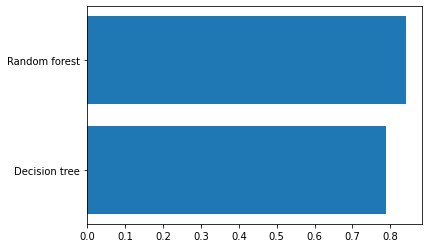

In [ ]:
fig, ax = plt.subplots()
ax.barh(group_names, group_data)

[Text(0, 0.5, 'Machine learning model used'),
 (0.0, 1.0),
 Text(0.5, 0, 'Accuracy percentage'),
 Text(0.5, 1.0, 'Model accuracy applied on Big data analytics')]

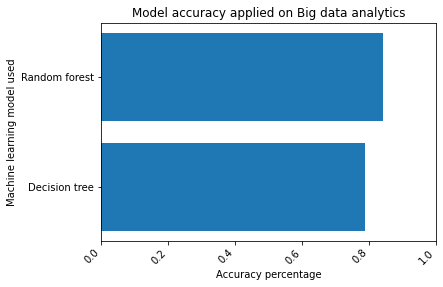

In [ ]:
fig, ax = plt.subplots()
ax.barh(group_names, group_data)
labels = ax.get_xticklabels()
plt.setp(labels, rotation=45, horizontalalignment='right')
ax.set(xlim=[0, 1], xlabel='Accuracy percentage', ylabel='Machine learning model used',
       title='Model accuracy applied on Big data analytics')

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

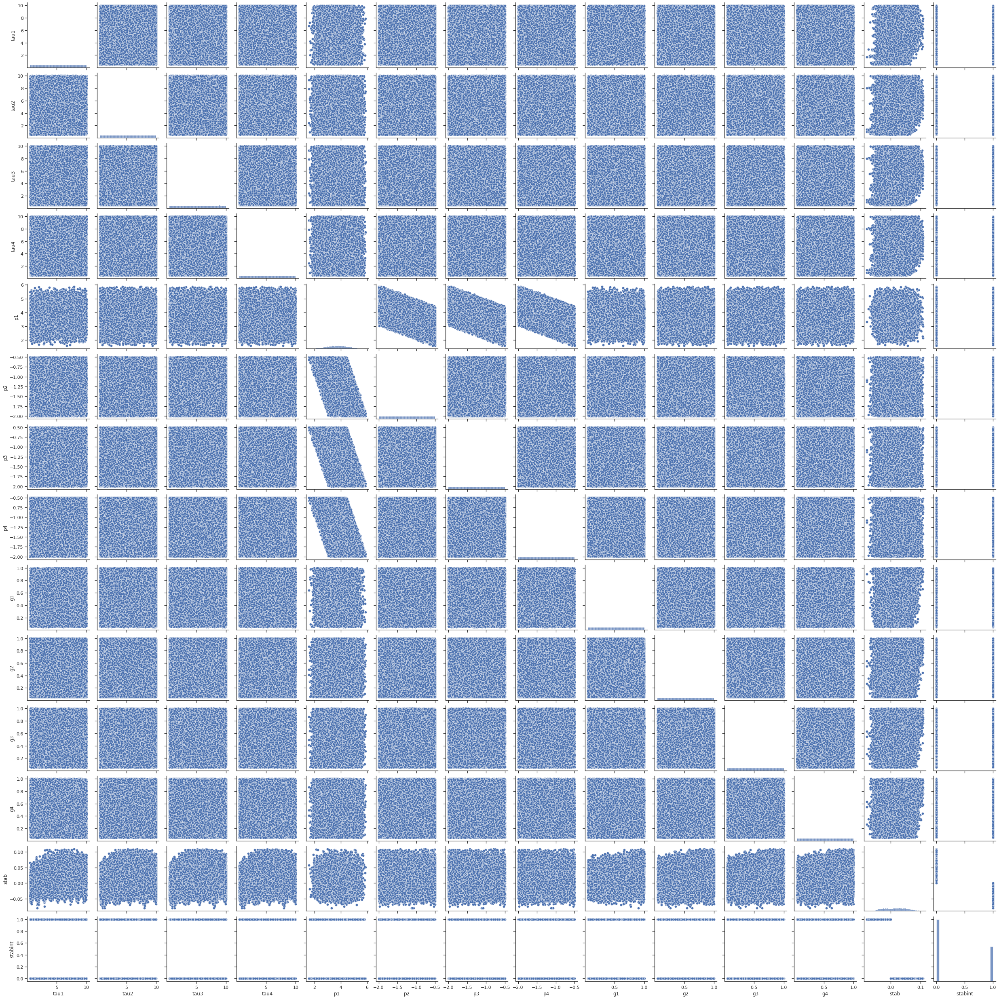

In [ ]:
import seaborn as sns
sns.set(style="ticks")

sns.pairplot(v_grid_df2.toPandas())
plt.show()

In [ ]:
vgrid_df2 = v_grid_df2.select(['features', 'stabint'])

RMS Error                      alpha
0.03609740189953758 1.0
0.03082864099203414 0.1
0.022844213811330547 0.010000000000000002
0.021979476840879423 0.0010000000000000002
0.02196595700472424 0.00010000000000000002
0.02196581408784943 1.0000000000000003e-05
0.021965812547595512 1.0000000000000004e-06


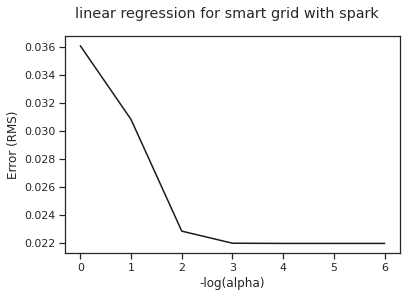

In [ ]:
splits = vgrid_df.randomSplit([0.60, 0.4])
xTrain_sp = splits[0]
xTest_sp = splits[1]
alphaList = [0.1**i for i in [0,1, 2, 3, 4, 5, 6]]
rmsError = []
for alph in alphaList:
  grid_ridge_sp = LinearRegression(featuresCol = 'features', \
                                  labelCol='stab', maxIter=100, regParam=alph, \
                                  elasticNetParam=0.0)
  grid_ridge_sp_model = grid_ridge_sp.fit(xTrain_sp)
  test_result = grid_ridge_sp_model.evaluate(xTest_sp)
  rmsError.append(test_result.rootMeanSquaredError)
print('{:30}'.format("RMS Error"), "alpha")
for i in range(len(rmsError)):
 print(rmsError[i], alphaList[i])
#plot curve of out-of-sample error versus alpha
x = range(len(rmsError))
plt.plot(x, rmsError, 'k')
plt.xlabel('-log(alpha)')
plt.ylabel('Error (RMS)')
plt.suptitle('linear regression for smart grid with spark')
plt.savefig('linear_regression_for_smart_grid_with_spark.png', dpi=500)
plt.show()

In [ ]:
from pyspark.ml.classification import MultilayerPerceptronClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Load training data
data = vgrid_df2
data = data.withColumnRenamed('stabint', 'label')
# Split the data into train and test
splits = data.randomSplit([0.6, 0.4], 1234)
train = splits[0]
test = splits[1]

# specify layers for the neural network:
# input layer of size 12 (features), two intermediate of size 5 and 4
# and output of size 2 (classes)
layers = [12, 5, 4, 2]

# create the trainer and set its parameters
trainer = MultilayerPerceptronClassifier(maxIter=100, layers=layers, blockSize=128, seed=1234)

# train the model
model = trainer.fit(train)

# compute accuracy on the test set
result = model.transform(test)
predictionAndLabels = result.select("prediction", "label")
evaluator = MulticlassClassificationEvaluator(metricName="accuracy")
print("Test set accuracy = " + str(evaluator.evaluate(predictionAndLabels)))

Test set accuracy = 0.8708699983396978


In [ ]:
train_output_df = model.transform(train)
test_output_df = model.transform(test)

In [ ]:

train_predictionAndLabels = train_output_df.select('prediction', 'label')
test_predictionAndLabels = test_output_df.select('prediction', 'label')

In [ ]:
metrics = ['weightedPrecision', 'weightedRecall', 'accuracy']
for metric in metrics:
  evaluator = MulticlassClassificationEvaluator(metricName=metric)
  print('Train ' + metric + ' = ' + str(evaluator.evaluate(
      train_predictionAndLabels)))
  print('Test ' + metric + ' = ' + str(evaluator.evaluate(
      test_predictionAndLabels)))

Train weightedPrecision = 0.8697230530732687
Test weightedPrecision = 0.8708667800208139
Train weightedRecall = 0.8696947755374846
Test weightedRecall = 0.8708699983396979
Train accuracy = 0.8696947755374846
Test accuracy = 0.8708699983396978


In [ ]:
import numpy as np
import matplotlib.pyplot as plt


data = {'Decision tree': 0.78912,
        'Random forest': 0.8413816230717639,
        'Deep learning': 0.8708699983396978}
group_data = list(data.values())
group_names = list(data.keys())
group_mean = np.mean(group_data)

<BarContainer object of 3 artists>

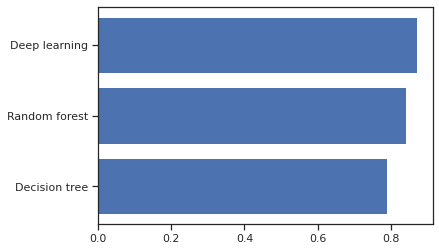

In [ ]:
fig, ax = plt.subplots()
ax.barh(group_names, group_data)

[Text(0, 0.5, 'Machine learning model used'),
 (0.0, 1.0),
 Text(0.5, 0, 'Accuracy percentage'),
 Text(0.5, 1.0, 'Model accuracy applied on Big data analytics')]

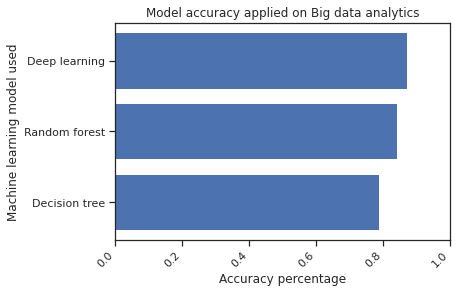

In [ ]:
fig, ax = plt.subplots()
ax.barh(group_names, group_data)
labels = ax.get_xticklabels()
plt.setp(labels, rotation=45, horizontalalignment='right')
ax.set(xlim=[0, 1], xlabel='Accuracy percentage', ylabel='Machine learning model used',
       title='Model accuracy applied on Big data analytics')

<BarContainer object of 3 artists>

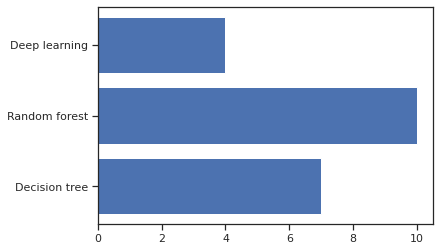

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


data = {'Decision tree': 7,
        'Random forest': 10,
        'Deep learning': 4}
group_data = list(data.values())
group_names = list(data.keys())
group_mean = np.mean(group_data)

<BarContainer object of 3 artists>

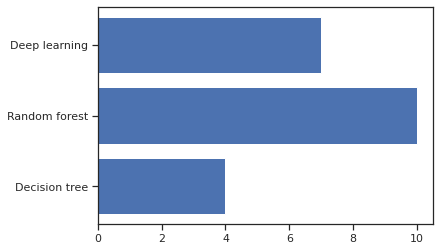

In [ ]:
fig, ax = plt.subplots()
ax.barh(group_names, group_data)

In [ ]:
fig, ax = plt.subplots()
ax.barh(group_names, group_data)
labels = ax.get_xticklabels()
plt.setp(labels, rotation=45, horizontalalignment='right')
ax.set(xlim=[0, 1], xlabel='Accuracy percentage', ylabel='Machine learning model used',
       title='Model accuracy applied on Big data analytics')

[Text(0, 0.5, 'Machine learning model used'),
 (0.0, 10.0),
 Text(0.5, 0, 'Run Timing in seconds '),
 Text(0.5, 1.0, 'Run time for the applied Big data analytics on decentralized smart grid system')]

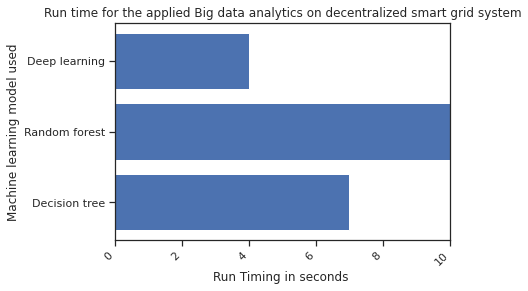

In [ ]:
fig, ax = plt.subplots()
ax.barh(group_names, group_data)
labels = ax.get_xticklabels()
plt.setp(labels, rotation=45, horizontalalignment='right')
ax.set(xlim=[0, 10], xlabel='Run Timing in seconds ', ylabel='Machine learning model used',
       title='Run time for the applied Big data analytics on decentralized smart grid system')